# Figures for perspective paper
# Evaluation of a UoB models on 60km -> 2.2km-4x over Birmingham)

In [ ]:
%reload_ext autoreload

%autoreload 2

%reload_ext dotenv
%dotenv

import functools
import math
import string

import IPython
import matplotlib.pyplot as plt
import numpy as np
import xarray as xr

from mlde_analysis.data import prep_eval_data
from mlde_analysis import plot_map
from mlde_analysis.distribution import normalized_mean_bias, plot_freq_density, plot_mean_biases, rms_mean_bias
from mlde_analysis.fractional_contribution import compute_fractional_contribution, plot_fractional_contribution, frac_contrib_change, fc_bins
from mlde_analysis.ccs import compute_changes, plot_changes, plot_tp_fd, bootstrap_seasonal_mean_pr_change_samples
from mlde_analysis.display import pretty_table
from mlde_utils import cp_model_rotated_pole

cannot find .env file


In [ ]:
import matplotlib
matplotlib.rcParams['figure.dpi'] = 300

In [ ]:
split = "test"
ensemble_members = [
    "01",
    "04",
    "05",
    "06",
    "07",
    "08",
    "09",
    "10",
    "11",
    "12",
    "13",
    "15",
]
dataset_configs = {
    "CPM": "bham64_ccpm-4x_12em_psl-sphum4th-temp4th-vort4th_pr",
    "GCM": "bham64_gcm-4x_12em_psl-sphum4th-temp4th-vort4th_pr",
}
samples_per_run = 6
sample_configs = {
    "CPM": [
        {
            "label": "Diffusion (cCPM)",
            "sample_specs": [
                {
                    "fq_model_id": "score-sde/subvpsde/ukcp_local_pr_12em_cncsnpp_continuous/bham-4x_12em_pSTV",
                    "checkpoint": "epoch_20",
                    "input_xfm": "bham64_ccpm-4x_12em_psl-sphum4th-temp4th-vort4th_pr-stan",
                    "dataset": "bham64_ccpm-4x_12em_psl-sphum4th-temp4th-vort4th_pr",
                    "variables": ["pr"],
                },
            ],
            "deterministic": False,
            "CCS": False,
            "color": "tab:blue",
            "order": 10,
        }
    ],
    "GCM": [
        {
            "label": "Diffusion (GCM)",
            "sample_specs": [
                {
                    "fq_model_id": "score-sde/subvpsde/ukcp_local_pr_12em_cncsnpp_continuous/bham-4x_12em_pSTV",
                    "checkpoint": "epoch_20",
                    "input_xfm": "bham64_gcm-4x_12em_psl-sphum4th-temp4th-vort4th_pr-pixelmmsstan",
                    "dataset": "bham64_gcm-4x_12em_psl-sphum4th-temp4th-vort4th_pr",
                    "variables": ["pr"],
                }
            ],
            "deterministic": False,
            "CCS": True,
            "PSD": True,
            "UQ": False,
            "color": "tab:green",
            "order": 100,
        },
        {
            "label": "Diff no-bc (GCM)",
            "sample_specs": [
                {
                    "fq_model_id": "score-sde/subvpsde/ukcp_local_pr_12em_cncsnpp_continuous/bham-4x_12em_pSTV",
                    "checkpoint": "epoch_20",
                    "input_xfm": "bham64_ccpm-4x_12em_psl-sphum4th-temp4th-vort4th_pr-stan",
                    "dataset": "bham64_gcm-4x_12em_psl-sphum4th-temp4th-vort4th_pr",
                    "variables": ["pr"],
                }
            ],
            "deterministic": False,
            "CCS": True,
            "PSD": True,
            "UQ": False,
            "color": "tab:red",
            "order": 100,
        },
        {
            "label": "Diff no-hum (GCM)",
            "sample_specs": [
                {
                    "fq_model_id": "score-sde/subvpsde/ukcp_local_pr_12em_cncsnpp_continuous/bham-4x_12em_pTV-original",
                    "checkpoint": "epoch_20",
                    "input_xfm": "bham64_gcm-4x_12em_psl-temp4th-vort4th_pr-pixelmmsstan",
                    "dataset": "bham64_gcm-4x_12em_psl-temp4th-vort4th_pr",
                    "variables": ["pr"],
                }
            ],
            "deterministic": False,
            "CCS": True,
            "PSD": True,
            "UQ": False,
            "color": "tab:orange",
            "order": 100,
        },
    ],
}
derived_variables_config={}
eval_vars = ["pr"]

## Data

* Using all 12 ensemble members on 1981-2000, 2021-2040 and 2061-2080 periods for initial UKCP Local release (but using data post graupel bug fix)
* Splits are based on random choice of seasons with equal number of seasons from each time slice
* Target domain and resolution: 64x64@8.8km (4x 2.2km) England and Wales
* Input resolution: 60km (cCPM is CPM coarsened to GCM 60km grid)

## CPMGEM models

Compare:

* cCPM input source
* GCM with bias correction input source
* GCM without bias correction
* GCM input source without humidity (pTV)

### Shared model specs

* Inputs variable (unless otherwise stated): pSTV (pressure at sea level and 4 levels of specific humidity, air temp and relative vorticity)
* Input transforms are fitted on dataset in use (ie separate GCM and CPM versions) while target transform is fitted only at training on the CPM dataset
* No loc-spec params
* 6 samples per example

In [ ]:
EVAL_DS, MODELS = prep_eval_data(sample_configs, dataset_configs, derived_variables_config, eval_vars, split, ensemble_members=ensemble_members, samples_per_run=samples_per_run)
EVAL_DS

{'CPM': <xarray.Dataset>
 Dimensions:                     (time: 3240, grid_latitude: 64,
                                  grid_longitude: 64, ensemble_member: 12,
                                  model: 1, sample_id: 6, bnds: 2)
 Coordinates:
   * time                        (time) object 1981-03-01 12:00:00 ... 2076-08...
     season                      (time) float64 1.0 1.0 1.0 1.0 ... 2.0 2.0 2.0
   * grid_latitude               (grid_latitude) float32 -2.49 -2.41 ... 2.55
   * grid_longitude              (grid_longitude) float32 357.9 358.0 ... 363.0
   * ensemble_member             (ensemble_member) object '01' '04' ... '13' '15'
   * model                       (model) object 'Diffusion (cCPM)'
     time_period                 (time) <U8 'historic' 'historic' ... 'future'
     dec_adjusted_year           (time) int64 1981 1981 1981 ... 2076 2076 2076
     stratum                     (time) <U12 'historic MAM' ... 'future JJA'
     tp_season_year              (time) <U17 'his

In [ ]:
CPM_DAS = { var: EVAL_DS["CPM"][f"target_{var}"] for var in eval_vars }

## Fractional contribution (including change from Historic to Future) and mean bias 

In [ ]:
ccs_seasons = ["DJF", "JJA"]
ccs_models = {source: {model: spec for model, spec in mconfigs.items() if spec.get("CCS", False)} for source, mconfigs in MODELS.items() }

historical_cpm_pr = CPM_DAS["pr"].where(CPM_DAS["pr"]["time_period"]== "historic", drop=True)

def fig_data(eval_ds, cpm_pr):
    mean_biases = [ dict(data=normalized_mean_bias(eval_ds["GCM"]["pred_pr"].sel(model=model), cpm_pr), label=model) for model, spec in MODELS["GCM"].items() ]

    cpm_fc = compute_fractional_contribution(cpm_pr, bins=fc_bins())

    fraccontrib_data = [
        dict(data=cpm_fc, label="CPM", color="black", source="CPM")
    ]

    fraccontrib_err_data = [
        dict(data=(compute_fractional_contribution(eval_ds[spec["source"]]["pred_pr"].sel(model=model), bins=fc_bins()) - cpm_fc), label=model, color=spec["color"]) for source, mconfigs in MODELS.items() for model, spec in mconfigs.items()
    ]
    
    tp_frcontrib_data = [
                dict(data=frac_contrib_change(cpm_pr, bins=fc_bins()), label="CPM", color="black", source="CPM")
        ] + [
            dict(data=frac_contrib_change(eval_ds[source]["pred_pr"].sel(model=model), bins=fc_bins()), label=model, color=spec["color"], source=source) for source, mconfigs in ccs_models.items() for model, spec in mconfigs.items()
        ]

    return fraccontrib_data, fraccontrib_err_data, tp_frcontrib_data, mean_biases

In [ ]:
def plot_figure(fraccontrib_data, fraccontrib_err_data, frcontrib_change_data, mean_biases):
    fig = plt.figure(layout='constrained', figsize=(4.5, 6.5))

    meanb_axes_keys = list(map(lambda x: f"meanb {x['label']}", mean_biases))
    meanb_spec = np.array(meanb_axes_keys).reshape(1,-1)

    # dist_spec = np.array(["Density"] * meanb_spec.shape[1]).reshape(1,-1)
    dist_spec = np.array(["FCErr"] * (meanb_spec.shape[1])).reshape(1,-1)

    ccs_spec = np.array(["Change"] * meanb_spec.shape[1]).reshape(1,-1)

    spec = np.concatenate([dist_spec, meanb_spec, ccs_spec], axis=0)

    axd = fig.subplot_mosaic(spec, gridspec_kw=dict(height_ratios=[3, 2, 3]), per_subplot_kw={ak: {"projection": cp_model_rotated_pole} for ak in meanb_axes_keys})
    
    ax = axd["FCErr"]
    plot_fractional_contribution(fraccontrib_err_data, ax=ax, title="Error", linewidth=1, ylim=[-0.2, 0.2])
    ax.annotate("a.", xy=(0.04, 1.0), xycoords=("figure fraction", "axes fraction"), weight='bold', ha="left", va="bottom")

    axes = plot_mean_biases(mean_biases, axd, colorbar=True)
    axes[0].annotate("b.", xy=(0.04, 1.0), xycoords=("figure fraction", "axes fraction"), weight='bold', ha="left", va="bottom")

    ax = axd["Change"]
    plot_fractional_contribution(frcontrib_change_data, ax=ax, title="Change from Historic to Future", linewidth=1, legend=False, ylim=[-0.3, 0.3])
    ax.annotate("c.", xy=(0.04, 1.0), xycoords=("figure fraction", "axes fraction"), weight='bold', ha="left", va="bottom")

    ax = fig.add_axes([0.79, 0.82, 0.18, 0.18])
    plot_fractional_contribution(fraccontrib_data, ax=ax, title="", linewidth=1, legend=False,)
    ax.set_title("CPM frac. contrib.", pad=1, fontsize="xx-small")
    ax.set_xlabel("")#("Precip (mm/day)")
    ax.set_ylabel("")#("Fractional contrib.\n(mm/day)")
    ax.tick_params(axis='both', which='major', labelsize="xx-small")
    ax.tick_params(axis='both', which='minor', labelsize="xx-small")
    ax.set_aspect(1)
    
    return fig

### Annual Figure

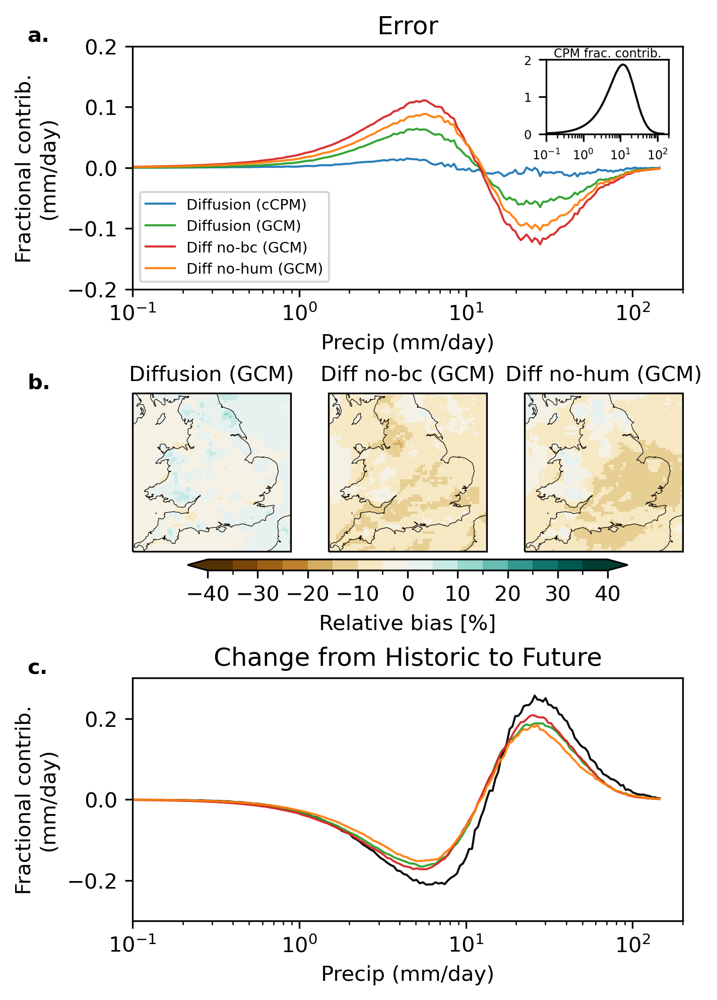

,Root Mean Square Mean Bias (mm/day)
model,
Diffusion (cCPM),0.09
Diff no-bc (GCM),0.20
Diff no-hum (GCM),0.18
Diffusion (GCM),0.08


'<style type="text/css">\n</style>\n<table id="T_b1b3b" style=\'display:inline\'>\n  <thead>\n    <tr>\n      <th class="blank level0" >&nbsp;</th>\n      <th id="T_b1b3b_level0_col0" class="col_heading level0 col0" >Root Mean Square Mean Bias (mm/day)</th>\n    </tr>\n    <tr>\n      <th class="index_name level0" >model</th>\n      <th class="blank col0" >&nbsp;</th>\n    </tr>\n  </thead>\n  <tbody>\n    <tr>\n      <th id="T_b1b3b_level0_row0" class="row_heading level0 row0" >Diffusion (cCPM)</th>\n      <td id="T_b1b3b_row0_col0" class="data row0 col0" >0.09</td>\n    </tr>\n    <tr>\n      <th id="T_b1b3b_level0_row1" class="row_heading level0 row1" >Diff no-bc (GCM)</th>\n      <td id="T_b1b3b_row1_col0" class="data row1 col0" >0.20</td>\n    </tr>\n    <tr>\n      <th id="T_b1b3b_level0_row2" class="row_heading level0 row2" >Diff no-hum (GCM)</th>\n      <td id="T_b1b3b_row2_col0" class="data row2 col0" >0.18</td>\n    </tr>\n    <tr>\n      <th id="T_b1b3b_level0_row3" class="r

In [ ]:
fraccontrib_data, fraccontrib_err_data, tp_frcontrib_data, mean_biases = fig_data(EVAL_DS, CPM_DAS["pr"])

rms_mean_biases = xr.concat(
        [ ds["pred_pr"].groupby("model", squeeze=False).map(lambda x: rms_mean_bias(x, CPM_DAS["pr"])) for ds in EVAL_DS.values() ],
        dim="model",
    )

plot_figure(fraccontrib_data, fraccontrib_err_data, tp_frcontrib_data, mean_biases)
plt.show()

pretty_table(rms_mean_biases.rename("Root Mean Square Mean Bias (mm/day)"), round=2)

### Seasonal figures

#### DJF

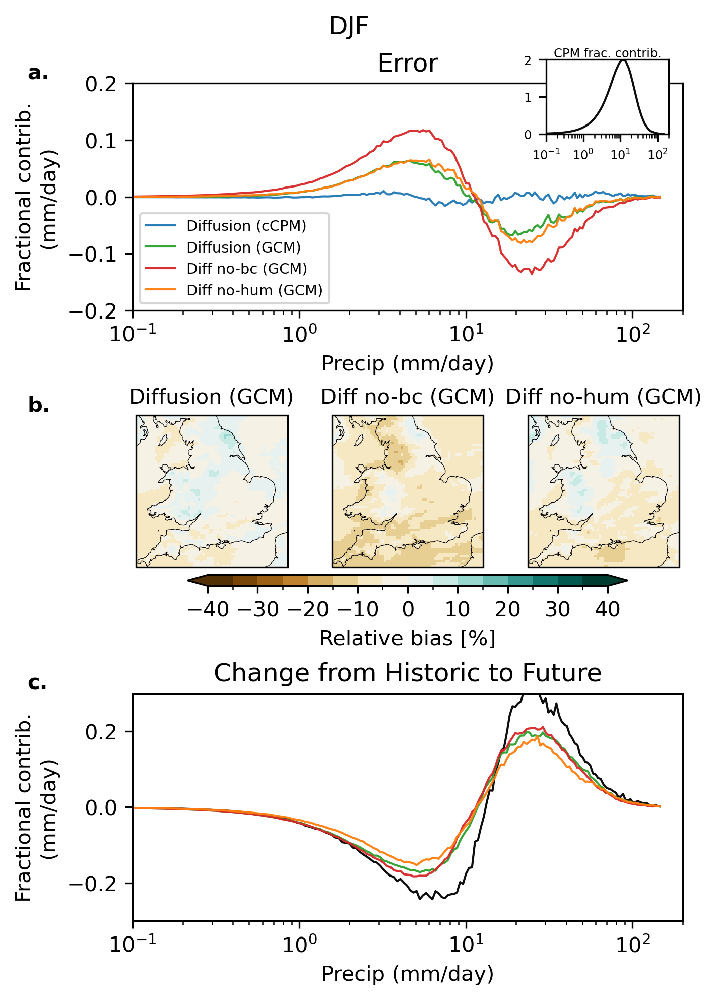

,Root Mean Square Mean Bias (mm/day)
model,
Diffusion (cCPM),0.11
Diff no-bc (GCM),0.32
Diff no-hum (GCM),0.19
Diffusion (GCM),0.14


#### JJA

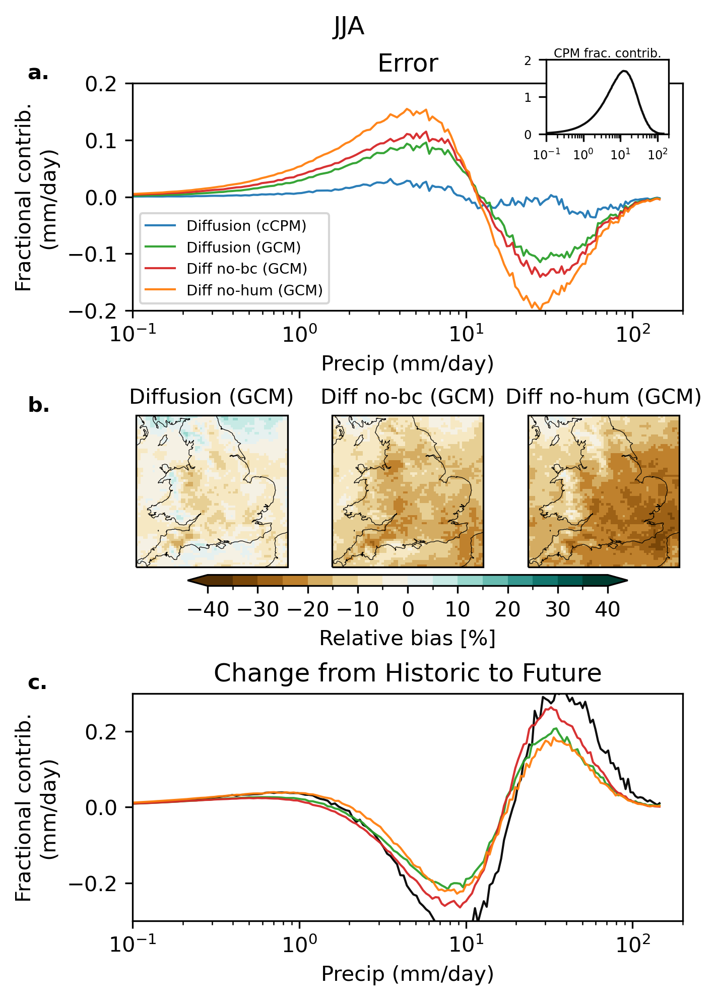

,Root Mean Square Mean Bias (mm/day)
model,
Diffusion (cCPM),0.06
Diff no-bc (GCM),0.22
Diff no-hum (GCM),0.27
Diffusion (GCM),0.11


In [ ]:
for season in ["DJF", "JJA"]:
    IPython.display.display_markdown(f"#### {season}", raw=True)
    seasonal_cpm_pr = CPM_DAS["pr"].where(CPM_DAS["pr"]["time.season"] == season)
    seasonal_eval_ds = { source: ds.where(ds["time.season"] == season) for source, ds in EVAL_DS.items() }
    seasonal_fig = plot_figure(*fig_data(seasonal_eval_ds, seasonal_cpm_pr))
    seasonal_fig.suptitle(season)
    plt.show()

    rms_mean_biases = xr.concat(
            [ ds["pred_pr"].groupby("model", squeeze=False).map(lambda x: rms_mean_bias(x, seasonal_cpm_pr)) for ds in seasonal_eval_ds.values() ],
            dim="model",
        )
    pretty_table(rms_mean_biases.rename("Root Mean Square Mean Bias (mm/day)"), round=2)

## CCS Figures

In [ ]:
ccs_seasons = ["DJF", "JJA"]
ccs_models = {source: {model: spec for model, spec in mconfigs.items() if spec.get("CCS", False) } for source, mconfigs in MODELS.items() }

ccs_pred_pr_das = [ EVAL_DS[source]["pred_pr"].sel(model=model) for source, models in ccs_models.items() for model in models ]

### 99th percentile changes

#### Quantile: 0.99

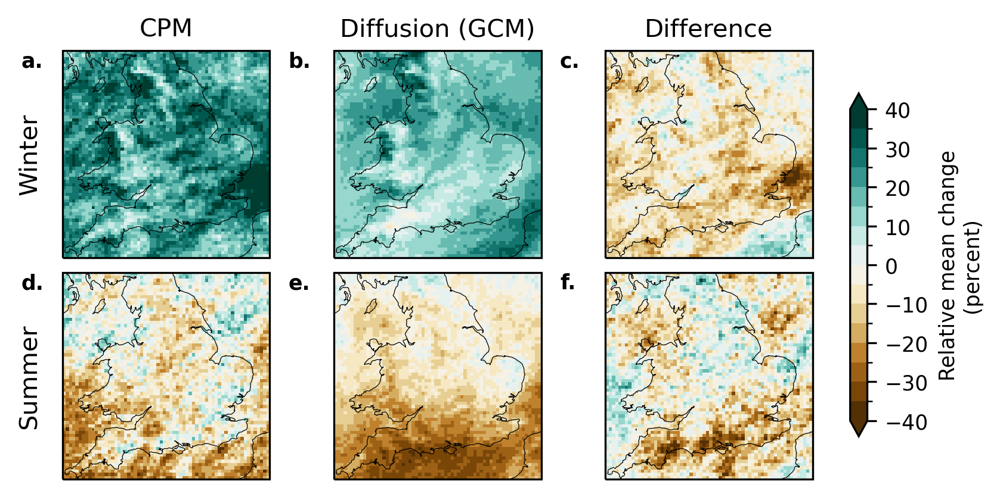

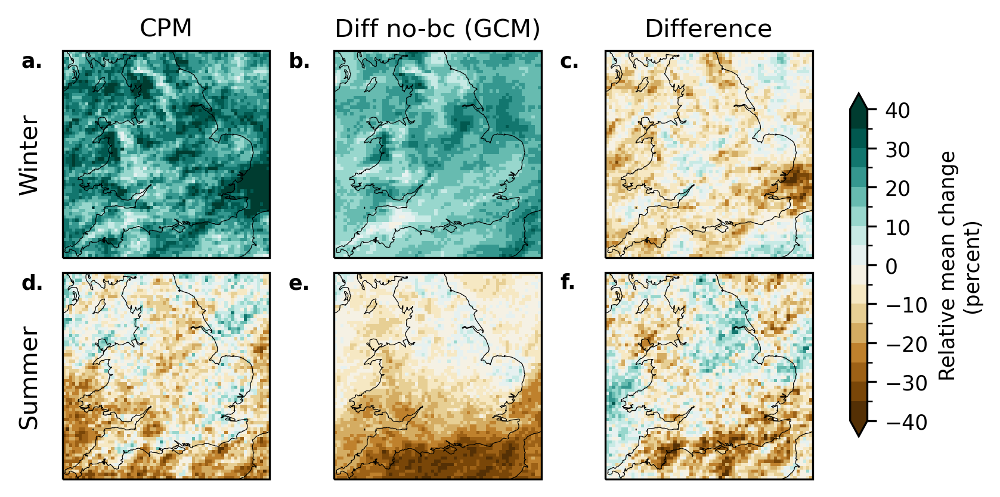

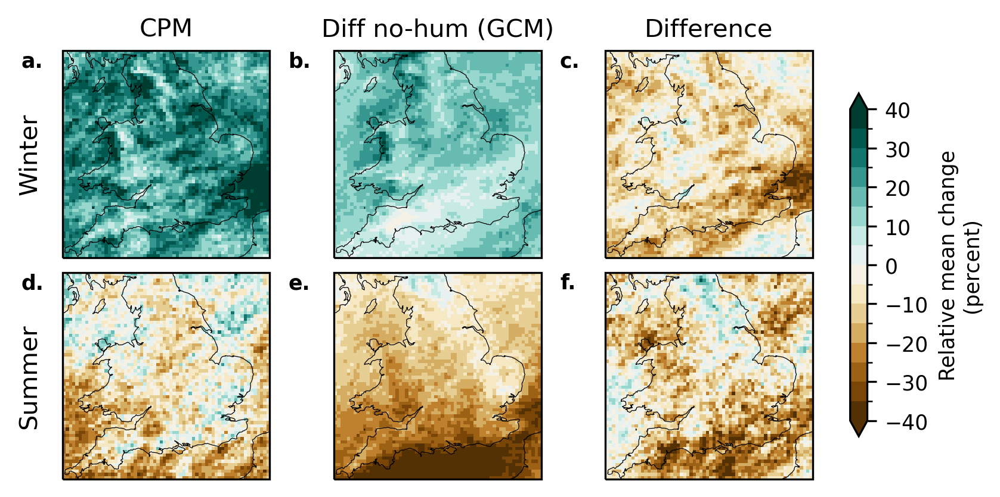

In [ ]:
from functools import partial

q = 0.99
IPython.display.display_markdown(f"#### Quantile: {q}", raw=True)

for ccs_pred_da in ccs_pred_pr_das:
    changes = compute_changes([ccs_pred_da], CPM_DAS["pr"], ccs_seasons, stat_func=partial(xr.DataArray.quantile, q=q))
    
    change_fig = plt.figure(figsize=(5.5, 5.5), layout="compressed")
    plot_changes(changes, ccs_seasons, change_fig, show_change=[ccs_pred_da.model.values.item()])

plt.show()

## Rough: wet-day mean

In [ ]:
from mlde_analysis.wet_dry import threshold_exceeded_prop_stats, threshold_exceeded_prop_change, plot_threshold_exceedence_errors

THRESHOLDS = {"pr": [0.1, 1.0]}

def wd_mean(da, threshold):
    dims = set(da.dims) - set(["grid_latitude", "grid_longitude"])
    return da.where(da > threshold).mean(dim=dims).rename("wd mean (mm/day)")

def wd_mean_change(da, threshold):
    from_da = da.where(da["time_period"] == "historic", drop=True)
    to_da = da.where(da["time_period"] == "future", drop=True)

    from_wd_mean = wd_mean(from_da, threshold=threshold).rename("Historic wd mean (mm/day)")
    to_wd_mean = wd_mean(to_da, threshold=threshold).rename("Future wd mean (mm/day)")

    change = (to_wd_mean - from_wd_mean).rename("Change in wd mean (mm/day)")

    return xr.merge([from_wd_mean, to_wd_mean, change])

def wd_mean_bias(pred_da, cpm_da, threshold):
    pred_wd_mean = wd_mean(pred_da, threshold)
    cpm_wd_mean = wd_mean(cpm_da, threshold)

    return (pred_wd_mean - cpm_wd_mean)

### Wet-day mean

#### Threshold: 0.1mm/day

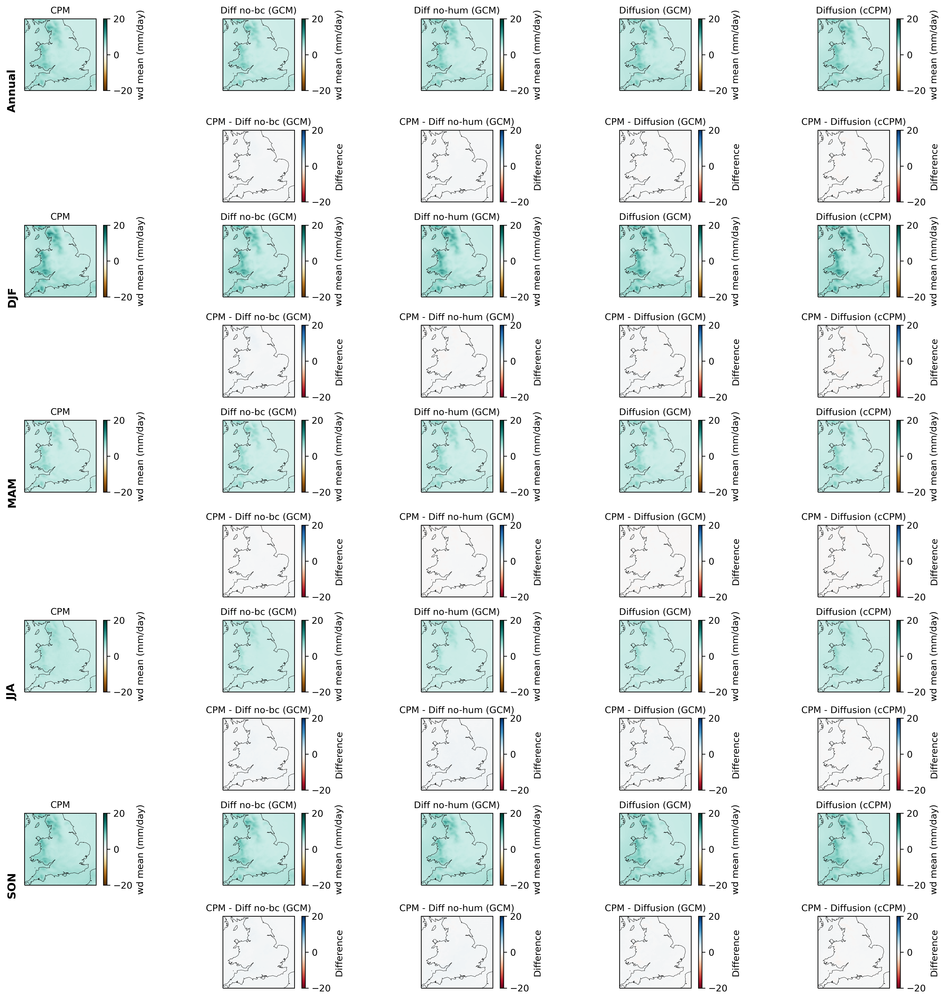

#### Threshold: 1.0mm/day

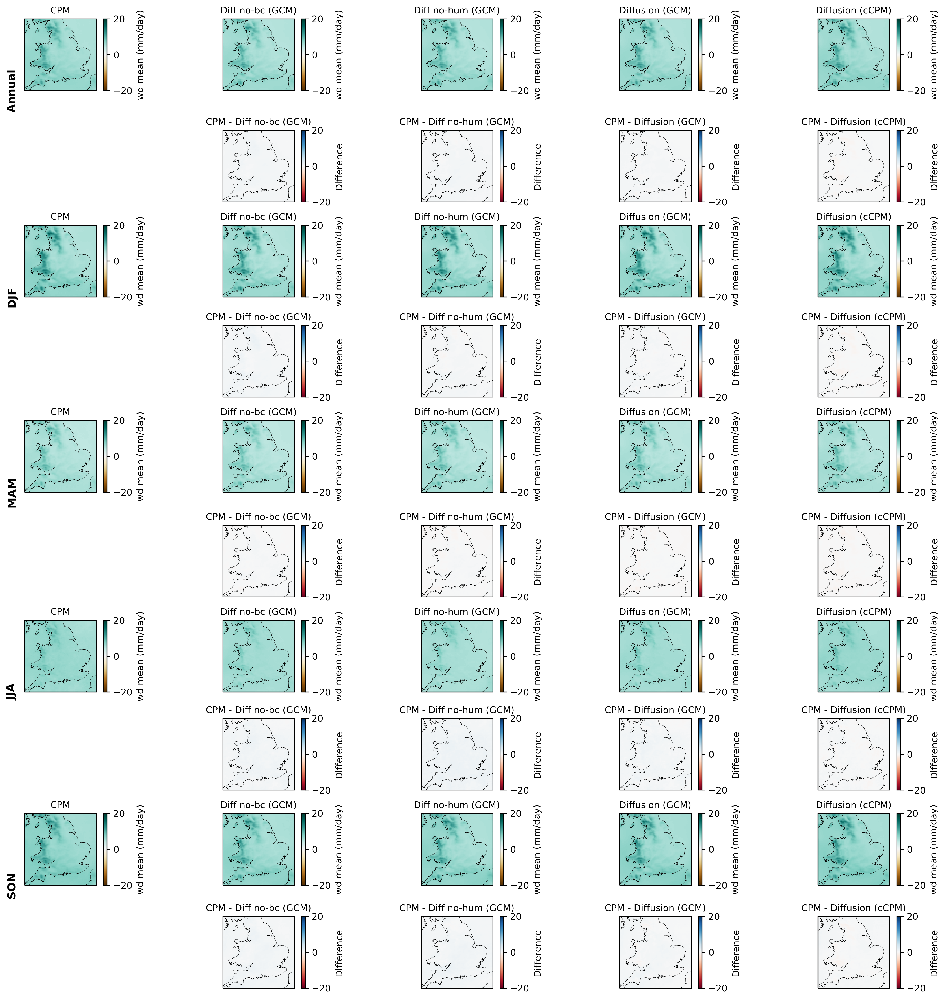

In [ ]:
model_das = xr.concat([
    EVAL_DS[source]["pred_pr"].sel(model=[model])
    for source, mconfigs in MODELS.items() for model, spec in mconfigs.items()
], dim="model")

change_stats = { var: { threshold: threshold_exceeded_prop_stats(model_das, CPM_DAS["pr"], threshold=threshold, threshold_exceeded_prop_statistic=wd_mean) for threshold in thresholds } for var, thresholds in THRESHOLDS.items() if var in eval_vars }

for var, thresholds in THRESHOLDS.items():
    if var in eval_vars:
        for threshold in thresholds:
            IPython.display.display_markdown(f"#### Threshold: {threshold}mm/day", raw=True)

            plot_threshold_exceedence_errors(change_stats[var][threshold], style="change")

            plt.show()

### Change from historic to future

#### Threshold: 0.1mm/day

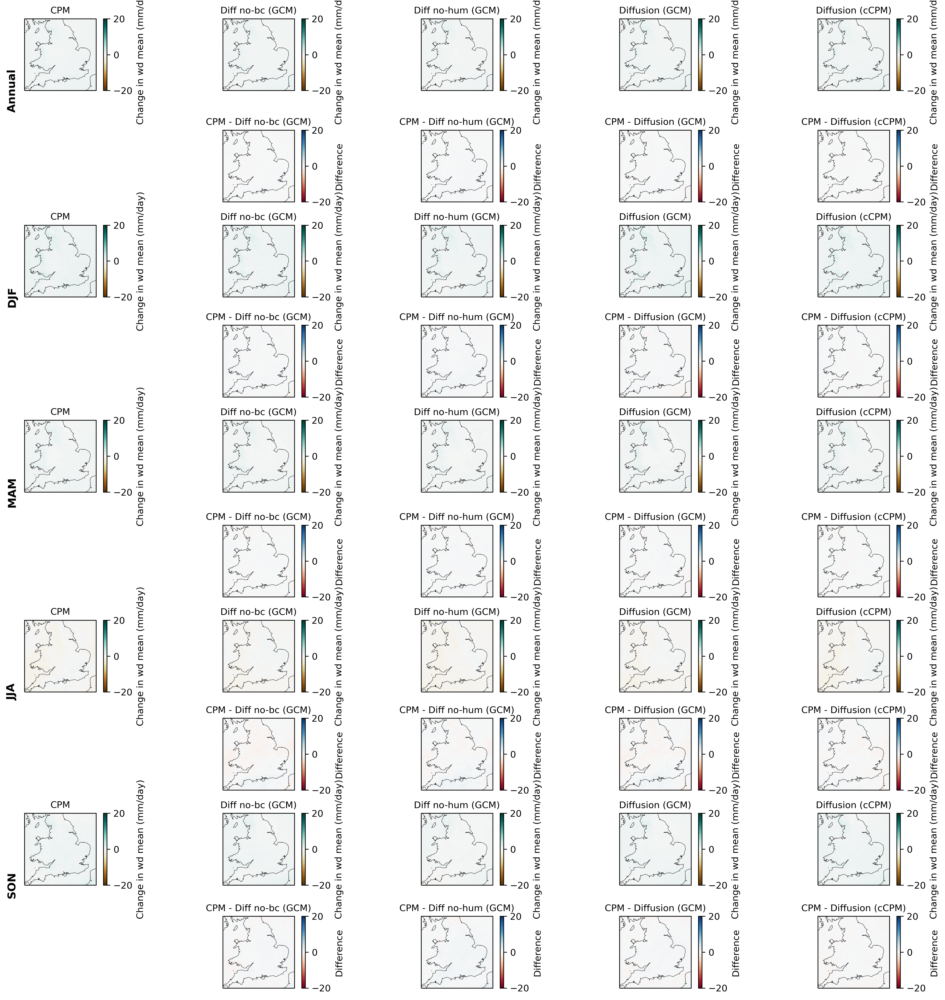

#### Threshold: 1.0mm/day

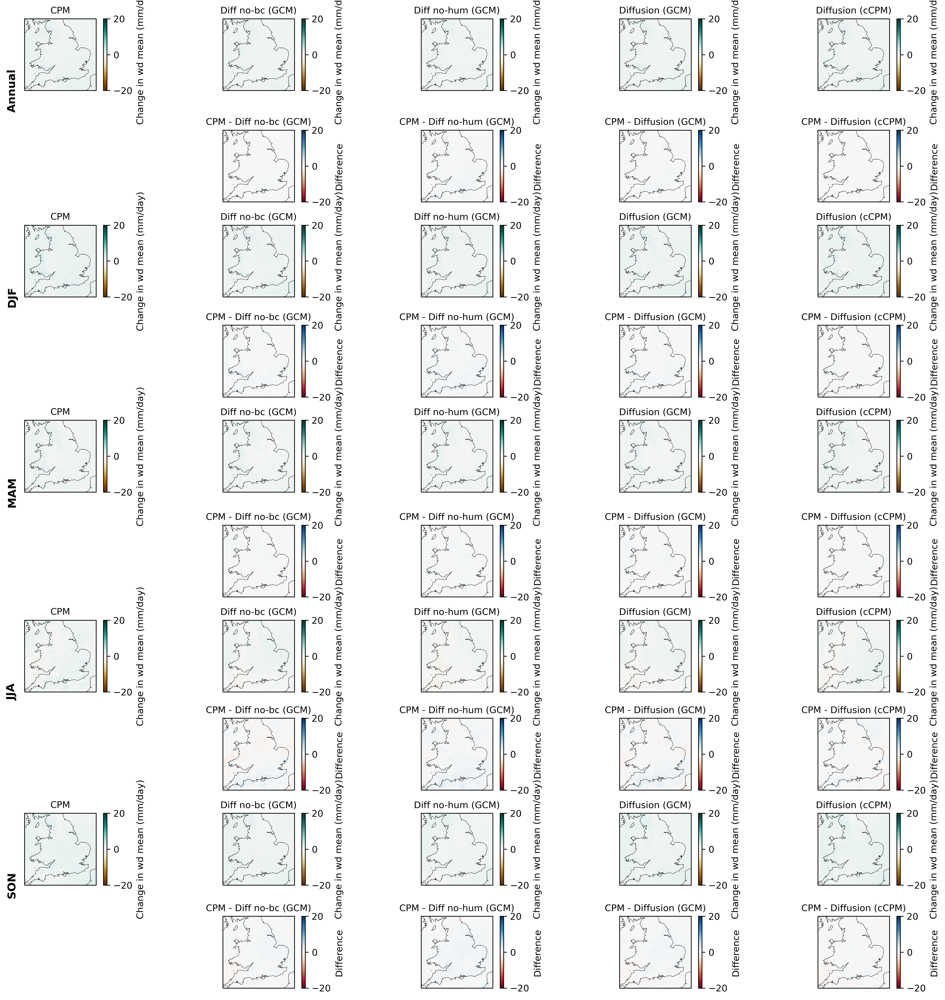

Historic wd mean (mm/day) 
 Future wd mean (mm/day) 
 Change in wd mean (mm/day) 
 
 
 threshold 
 season 
 model 
   
   
   
 
 
 
 
 0.100000 
 Annual 
 Diff no-bc (GCM) 
 4.2 
 4.6 
 0.4 
 
 
 Diff no-hum (GCM) 
 4.3 
 4.6 
 0.3 
 
 
 Diffusion (GCM) 
 4.4 
 4.8 
 0.4 
 
 
 Diffusion (cCPM) 
 4.4 
 4.9 
 0.5 
 
 
 CPM 
 4.5 
 5.0 
 0.5 
 
 
 DJF 
 Diff no-bc (GCM) 
 4.6 
 5.2 
 0.7 
 
 
 Diff no-hum (GCM) 
 4.8 
 5.4 
 0.6 
 
 
 Diffusion (GCM) 
 4.8 
 5.5 
 0.7 
 
 
 Diffusion (cCPM) 
 4.9 
 5.6 
 0.7 
 
 
 CPM 
 4.9 
 5.7 
 0.8 
 
 
 MAM 
 Diff no-bc (GCM) 
 3.7 
 4.0 
 0.3 
 
 
 Diff no-hum (GCM) 
 3.8 
 4.1 
 0.3 
 
 
 Diffusion (GCM) 
 3.8 
 4.2 
 0.3 
 
 
 Diffusion (cCPM) 
 3.8 
 4.2 
 0.4 
 
 
 CPM 
 3.7 
 4.1 
 0.4 
 
 
 JJA 
 Diff no-bc (GCM) 
 3.9 
 3.7 
 -0.2 
 
 
 Diff no-hum (GCM) 
 3.8 
 3.4 
 -0.4 
 
 
 Diffusion (GCM) 
 4.0 
 3.8 
 -0.2 
 
 
 Diffusion (cCPM) 
 4.2 
 4.0 
 -0.3 
 
 
 CPM 
 4.3 
 4.1 
 -0.3 
 
 
 SON 
 Diff no-bc (GCM) 
 4.5 
 5.0 
 0.5 
 
 
 Diff no-hum (GCM) 
 4.6 
 4.8 
 0.2 
 
 
 Diffusion (GCM) 
 4.7 
 5.2 
 0.4 
 
 
 Diffusion (cCPM) 
 4.7 
 5.3 
 0.6 
 
 
 CPM 
 4.9 
 5.4 
 0.5 
 
 
 1.000000 
 Annual 
 Diff no-bc (GCM) 
 6.0 
 6.6 
 0.6 
 
 
 Diff no-hum (GCM) 
 6.1 
 6.6 
 0.5 
 
 
 Diffusion (GCM) 
 6.2 
 6.8 
 0.6 
 
 
 Diffusion (cCPM) 
 6.3 
 7.0 
 0.7 
 
 
 CPM 
 6.3 
 7.1 
 0.8 
 
 
 DJF 
 Diff no-bc (GCM) 
 6.1 
 6.9 
 0.7 
 
 
 Diff no-hum (GCM) 
 6.4 
 7.0 
 0.6 
 
 
 Diffusion (GCM) 
 6.3 
 7.1 
 0.8 
 
 
 Diffusion (cCPM) 
 6.5 
 7.3 
 0.8 
 
 
 CPM 
 6.5 
 7.4 
 1.0 
 
 
 MAM 
 Diff no-bc (GCM) 
 5.3 
 5.8 
 0.4 
 
 
 Diff no-hum (GCM) 
 5.5 
 5.8 
 0.4 
 
 
 Diffusion (GCM) 
 5.5 
 5.9 
 0.4 
 
 
 Diffusion (cCPM) 
 5.6 
 6.0 
 0.5 
 
 
 CPM 
 5.4 
 6.0 
 0.6 
 
 
 JJA 
 Diff no-bc (GCM) 
 5.9 
 6.3 
 0.4 
 
 
 Diff no-hum (GCM) 
 5.8 
 5.9 
 0.1 
 
 
 Diffusion (GCM) 
 6.1 
 6.4 
 0.3 
 
 
 Diffusion (cCPM) 
 6.4 
 6.7 
 0.3 
 
 
 CPM 
 6.4 
 6.9 
 0.5 
 
 
 SON 
 Diff no-bc (GCM) 
 6.4 
 7.2 
 0.8 
 
 
 Diff no-hum (GCM) 
 6.5 
 7.0 
 0.6 
 
 
 Diffusion (GCM) 
 6.6 
 7.4 
 0.8 
 
 
 Diffusion (cCPM) 
 6.6 
 7.5 
 0.9 
 
 
 CPM 
 6.8 
 7.8 
 0.9

'<style type="text/css">\n</style>\n<table id="T_b94b9" style=\'display:inline\'>\n  <thead>\n    <tr>\n      <th class="blank" >&nbsp;</th>\n      <th class="blank" >&nbsp;</th>\n      <th class="blank level0" >&nbsp;</th>\n      <th id="T_b94b9_level0_col0" class="col_heading level0 col0" >Historic wd mean (mm/day)</th>\n      <th id="T_b94b9_level0_col1" class="col_heading level0 col1" >Future wd mean (mm/day)</th>\n      <th id="T_b94b9_level0_col2" class="col_heading level0 col2" >Change in wd mean (mm/day)</th>\n    </tr>\n    <tr>\n      <th class="index_name level0" >threshold</th>\n      <th class="index_name level1" >season</th>\n      <th class="index_name level2" >model</th>\n      <th class="blank col0" >&nbsp;</th>\n      <th class="blank col1" >&nbsp;</th>\n      <th class="blank col2" >&nbsp;</th>\n    </tr>\n  </thead>\n  <tbody>\n    <tr>\n      <th id="T_b94b9_level0_row0" class="row_heading level0 row0" rowspan="25">0.100000</th>\n      <th id="T_b94b9_level1_row0" 

In [ ]:
model_das = {var: xr.concat([
    EVAL_DS[source][f"pred_{var}"].sel(model=[model])
    for source, mconfigs in MODELS.items() for model, spec in mconfigs.items()
], dim="model") for var, thresholds in THRESHOLDS.items() if var in eval_vars}

change_stats = {
    var: {
        threshold: threshold_exceeded_prop_stats(model_das[var], CPM_DAS["pr"], threshold=threshold, threshold_exceeded_prop_statistic=wd_mean_change) for threshold in thresholds
    } for var, thresholds in THRESHOLDS.items() if var in eval_vars
}


for var, thresholds in THRESHOLDS.items():
    if var in eval_vars:
        for threshold in thresholds:
            IPython.display.display_markdown(f"#### Threshold: {threshold}mm/day", raw=True)

            plot_threshold_exceedence_errors(change_stats[var][threshold][f"Change in wd mean (mm/day)"], style="change")

            plt.show()

pretty_table(xr.merge([
    change_stats[var][threshold].mean(dim=["grid_latitude", "grid_longitude"]).expand_dims({"threshold": [threshold]})
    for var, thresholds in THRESHOLDS.items() if var in eval_vars for threshold in thresholds
]), dim_order=["threshold", "season", "model"])

## Rough: Wet day frequency

#### Threshold: 0.1mm/day

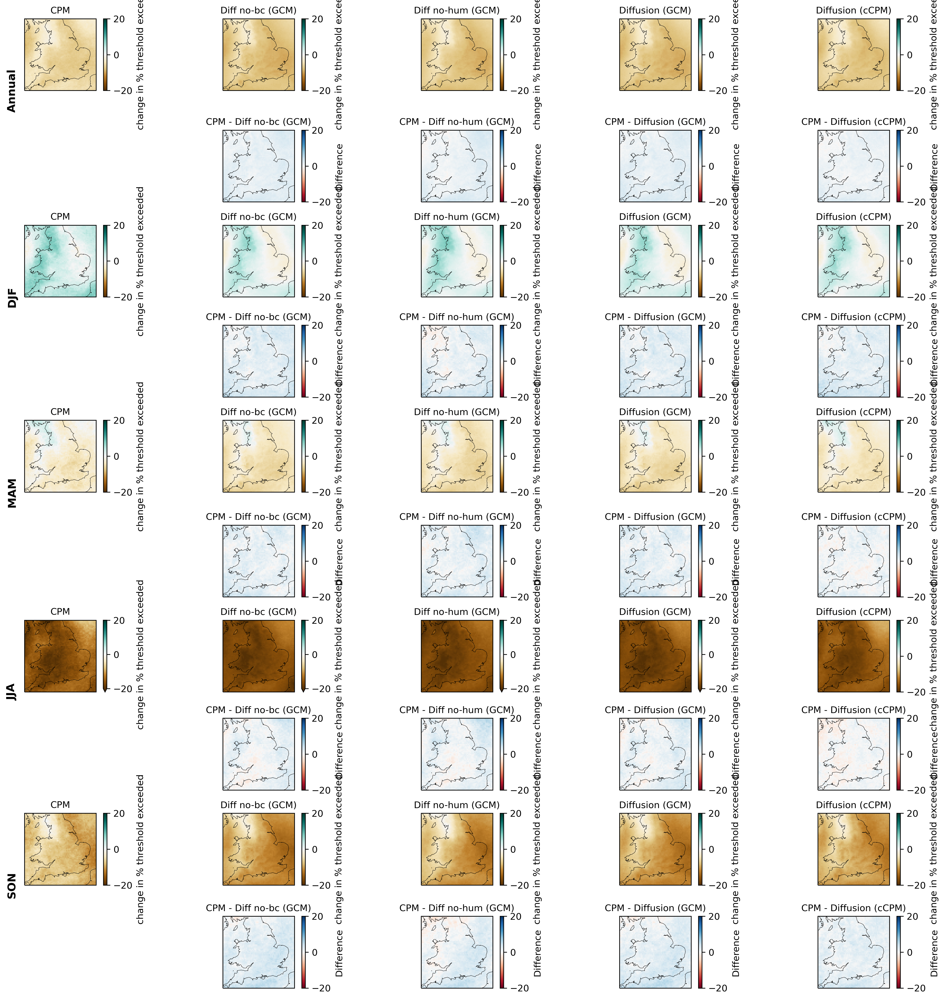

#### Threshold: 1.0mm/day

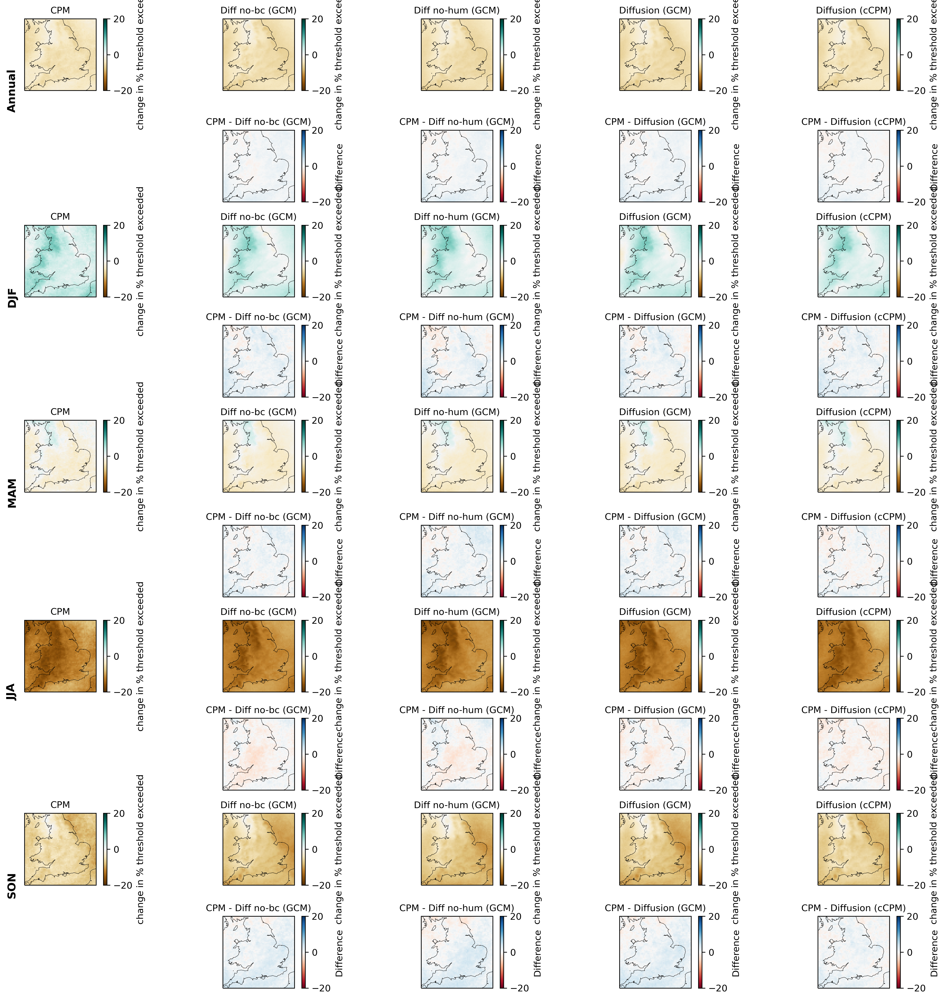

% Threshold exceeded (historic) 
 % Threshold exceeded (future) 
 change in % threshold exceeded 
 relative change in % threshold exceeded 
 
 
 threshold 
 season 
 model 
   
   
   
   
 
 
 
 
 0.100000 
 Annual 
 Diff no-bc (GCM) 
 56.5 
 49.2 
 -7.3 
 -13.1 
 
 
 Diff no-hum (GCM) 
 55.9 
 48.9 
 -7.0 
 -12.8 
 
 
 Diffusion (GCM) 
 58.3 
 51.0 
 -7.3 
 -12.7 
 
 
 Diffusion (cCPM) 
 55.8 
 49.3 
 -6.6 
 -12.0 
 
 
 CPM 
 55.6 
 50.2 
 -5.5 
 -10.0 
 
 
 DJF 
 Diff no-bc (GCM) 
 66.8 
 68.3 
 1.5 
 2.1 
 
 
 Diff no-hum (GCM) 
 66.7 
 68.7 
 2.0 
 2.9 
 
 
 Diffusion (GCM) 
 68.0 
 69.5 
 1.5 
 2.1 
 
 
 Diffusion (cCPM) 
 66.3 
 67.8 
 1.6 
 2.2 
 
 
 CPM 
 66.3 
 69.9 
 3.6 
 5.3 
 
 
 MAM 
 Diff no-bc (GCM) 
 59.1 
 55.2 
 -3.9 
 -6.7 
 
 
 Diff no-hum (GCM) 
 58.0 
 54.0 
 -3.9 
 -6.9 
 
 
 Diffusion (GCM) 
 61.0 
 57.0 
 -4.0 
 -6.6 
 
 
 Diffusion (cCPM) 
 57.8 
 54.8 
 -3.0 
 -5.2 
 
 
 CPM 
 56.7 
 54.5 
 -2.2 
 -4.0 
 
 
 JJA 
 Diff no-bc (GCM) 
 43.5 
 26.8 
 -16.7 
 -39.4 
 
 
 Diff no-hum (GCM) 
 43.2 
 26.4 
 -16.8 
 -40.2 
 
 
 Diffusion (GCM) 
 46.1 
 29.3 
 -16.8 
 -37.5 
 
 
 Diffusion (cCPM) 
 44.1 
 28.4 
 -15.7 
 -36.6 
 
 
 CPM 
 43.9 
 28.3 
 -15.6 
 -36.4 
 
 
 SON 
 Diff no-bc (GCM) 
 56.4 
 46.4 
 -10.0 
 -18.2 
 
 
 Diff no-hum (GCM) 
 55.6 
 46.5 
 -9.1 
 -17.0 
 
 
 Diffusion (GCM) 
 58.0 
 48.3 
 -9.8 
 -17.3 
 
 
 Diffusion (cCPM) 
 55.2 
 45.9 
 -9.3 
 -17.3 
 
 
 CPM 
 55.6 
 48.0 
 -7.6 
 -14.0 
 
 
 1.000000 
 Annual 
 Diff no-bc (GCM) 
 38.1 
 33.3 
 -4.8 
 -12.8 
 
 
 Diff no-hum (GCM) 
 38.0 
 33.2 
 -4.8 
 -13.1 
 
 
 Diffusion (GCM) 
 39.9 
 35.0 
 -4.9 
 -12.5 
 
 
 Diffusion (cCPM) 
 38.1 
 33.7 
 -4.4 
 -11.8 
 
 
 CPM 
 38.2 
 34.1 
 -4.1 
 -11.1 
 
 
 DJF 
 Diff no-bc (GCM) 
 48.0 
 50.5 
 2.5 
 5.0 
 
 
 Diff no-hum (GCM) 
 48.4 
 51.1 
 2.7 
 5.3 
 
 
 Diffusion (GCM) 
 49.4 
 52.1 
 2.7 
 5.4 
 
 
 Diffusion (cCPM) 
 48.1 
 50.8 
 2.7 
 5.4 
 
 
 CPM 
 48.3 
 51.9 
 3.5 
 7.2 
 
 
 MAM 
 Diff no-bc (GCM) 
 38.8 
 36.7 
 -2.1 
 -5.5 
 
 
 Diff no-hum (GCM) 
 38.6 
 36.3 
 -2.3 
 -6.2 
 
 
 Diffusion (GCM) 
 40.8 
 38.6 
 -2.2 
 -5.5 
 
 
 Diffusion (cCPM) 
 38.2 
 36.7 
 -1.5 
 -4.0 
 
 
 CPM 
 37.5 
 36.2 
 -1.3 
 -3.7 
 
 
 JJA 
 Diff no-bc (GCM) 
 27.2 
 14.9 
 -12.2 
 -46.2 
 
 
 Diff no-hum (GCM) 
 26.9 
 14.4 
 -12.5 
 -47.8 
 
 
 Diffusion (GCM) 
 29.3 
 16.6 
 -12.7 
 -44.4 
 
 
 Diffusion (cCPM) 
 28.4 
 16.2 
 -12.2 
 -44.0 
 
 
 CPM 
 28.6 
 15.8 
 -12.8 
 -45.6 
 
 
 SON 
 Diff no-bc (GCM) 
 38.5 
 31.2 
 -7.3 
 -19.5 
 
 
 Diff no-hum (GCM) 
 38.0 
 30.9 
 -7.2 
 -19.7 
 
 
 Diffusion (GCM) 
 40.1 
 32.8 
 -7.3 
 -18.8 
 
 
 Diffusion (cCPM) 
 37.6 
 31.1 
 -6.6 
 -17.9 
 
 
 CPM 
 38.4 
 32.4 
 -6.0 
 -16.0

'<style type="text/css">\n</style>\n<table id="T_1c315" style=\'display:inline\'>\n  <thead>\n    <tr>\n      <th class="blank" >&nbsp;</th>\n      <th class="blank" >&nbsp;</th>\n      <th class="blank level0" >&nbsp;</th>\n      <th id="T_1c315_level0_col0" class="col_heading level0 col0" >% Threshold exceeded (historic)</th>\n      <th id="T_1c315_level0_col1" class="col_heading level0 col1" >% Threshold exceeded (future)</th>\n      <th id="T_1c315_level0_col2" class="col_heading level0 col2" >change in % threshold exceeded</th>\n      <th id="T_1c315_level0_col3" class="col_heading level0 col3" >relative change in % threshold exceeded</th>\n    </tr>\n    <tr>\n      <th class="index_name level0" >threshold</th>\n      <th class="index_name level1" >season</th>\n      <th class="index_name level2" >model</th>\n      <th class="blank col0" >&nbsp;</th>\n      <th class="blank col1" >&nbsp;</th>\n      <th class="blank col2" >&nbsp;</th>\n      <th class="blank col3" >&nbsp;</th>\n 

In [ ]:
model_das = {var: xr.concat([
    EVAL_DS[source][f"pred_{var}"].sel(model=[model])
    for source, mconfigs in MODELS.items() for model, spec in mconfigs.items()
], dim="model") for var, thresholds in THRESHOLDS.items() if var in eval_vars}

change_stats = {
    var: {
        threshold: threshold_exceeded_prop_stats(model_das[var], CPM_DAS["pr"], threshold=threshold, threshold_exceeded_prop_statistic=threshold_exceeded_prop_change) for threshold in thresholds
    } for var, thresholds in THRESHOLDS.items() if var in eval_vars
}


for var, thresholds in THRESHOLDS.items():
    if var in eval_vars:
        for threshold in thresholds:
            IPython.display.display_markdown(f"#### Threshold: {threshold}mm/day", raw=True)

            plot_threshold_exceedence_errors(change_stats[var][threshold]["change in % threshold exceeded"], style="change")

            plt.show()

pretty_table(xr.merge([
    change_stats[var][threshold].mean(dim=["grid_latitude", "grid_longitude"]).expand_dims({"threshold": [threshold]})
    for var, thresholds in THRESHOLDS.items() if var in eval_vars for threshold in thresholds
]), dim_order=["threshold", "season", "model"])